In [26]:
#Import relevant packages
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [29]:
df_train = pd.read_csv('Data Source/train.csv')
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [31]:
#stats summary of house sale price
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

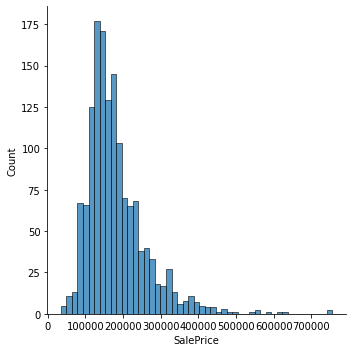

In [35]:
#hist
sns.displot(df_train['SalePrice']);

* Deviate from the normal distribution
* Skewed right
* Shows peakedness (values are concentrated around the mean)


In [37]:
#skewness and kurtosis
print("Skewness: %f" % df_train['SalePrice'].skew())
print("Kurtosis: %f" % df_train['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


*Skewness* is a measure of symetry, or more pricisely, the lack of symmetry. A distribution, or data set, is symmetric if it looks the same to the left and right of the center point (median).

*Kurtosis* is a measure whether the data are heavy-tailed or light-tailed relative to a normal distribution.That is, datasets with high kurtosis tend to have heavy tails, or outliers.


# Relationship between house price and numerical variables

<AxesSubplot:xlabel='GrLivArea', ylabel='SalePrice'>

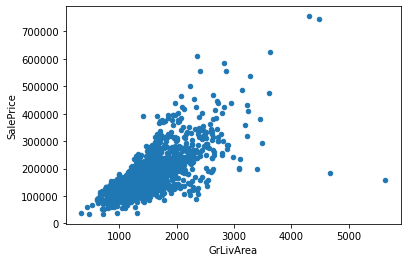

In [38]:
#Relationship with numerical variables
#scatter plot grlivarea/saleprice
var = 'GrLivArea'
data = pd.concat([df_train['SalePrice'],df_train[var]],axis=1)
data.plot.scatter(x=var,y='SalePrice')

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='SalePrice'>

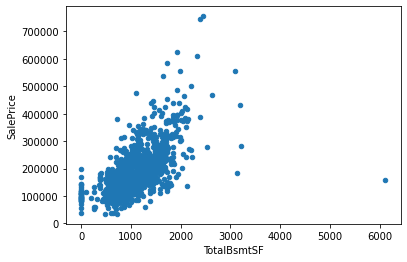

In [43]:
#scatter plot totalbsmatsf/saleprice
var = 'TotalBsmtSF'
data = pd.concat([df_train['SalePrice'],df_train[var]],axis=1)
data.plot.scatter(x=var,y='SalePrice')

# Relatioinship between house price and categorical variables

In [50]:
def concat(var):
    data = pd.concat([df_train[var],df_train['SalePrice']],axis=1)
    return data

(-0.5, 9.5, 0.0, 800000.0)

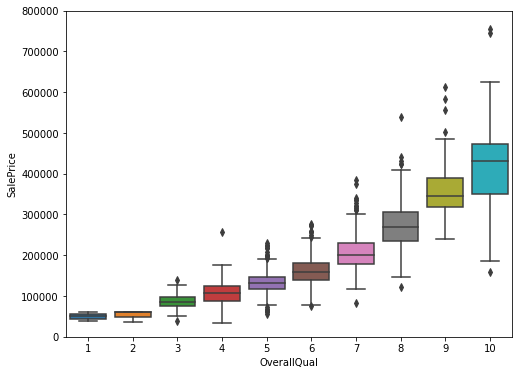

In [51]:
#Box plot Overallqual/saleprice
var = 'OverallQual'
data = concat(var)
f, ax = plt.subplots(figsize = (8,6))
fig = sns.boxplot(x=var,y='SalePrice',data=data)
fig.axis(ymin=0,ymax=800000)

(-0.5, 111.5, 0.0, 800000.0)

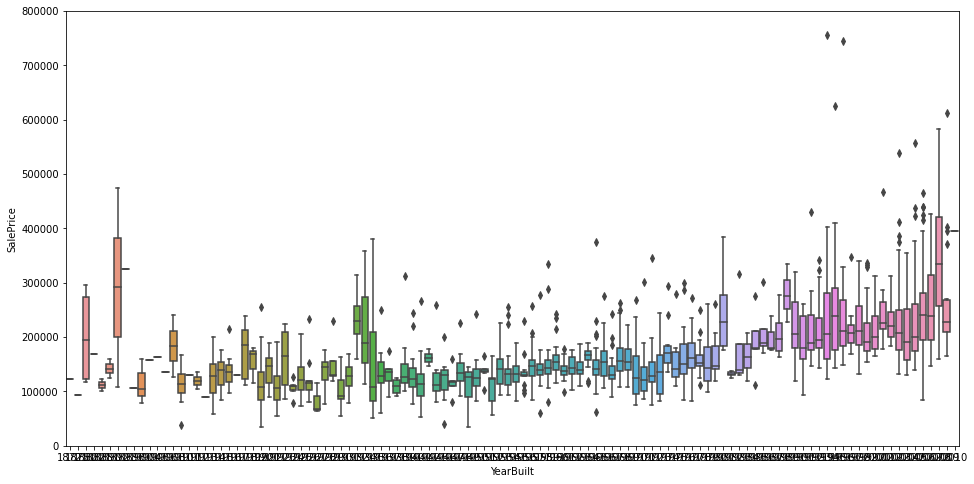

In [53]:
var = 'YearBuilt'
data = concat(var)
f, ax = plt.subplots(figsize=(16,8))
fig = sns.boxplot(x=var,y='SalePrice',data=data)
fig.axis(ymin=0,ymax=800000)


<AxesSubplot:>

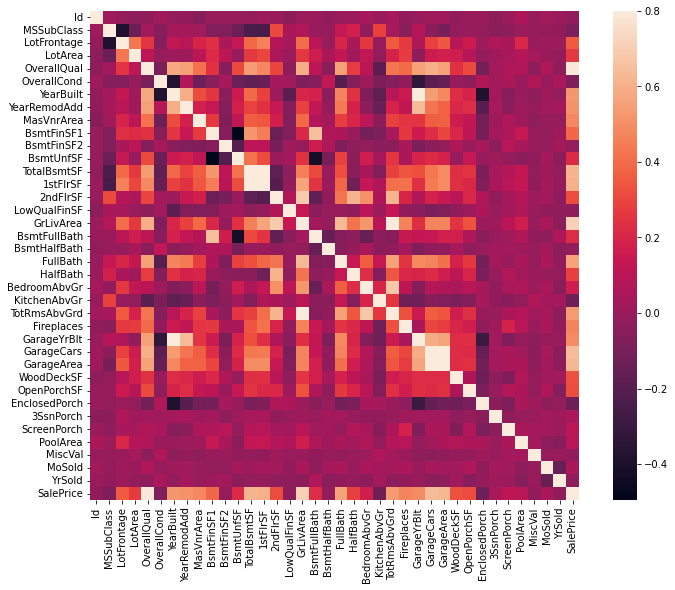

In [56]:
#Correlation matrix
corrmat = df_train.corr()
f , ax = plt.subplots(figsize=(12,9))
sns.heatmap(corrmat, vmax= .8,square=True)

<function matplotlib.pyplot.show(close=None, block=None)>

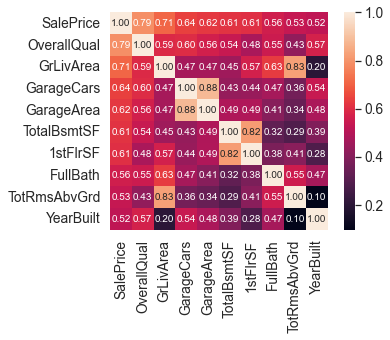

In [60]:
#Saleprice correlation matrix
k = 10 #number of variables for heatmap
cols = corrmat.nlargest(k,'SalePrice')['SalePrice'].index
cm = np.corrcoef(df_train[cols].values.T)
sns.set(font_scale = 1.25)
hm = sns.heatmap(cm, cbar=True, annot = True,square=True,fmt = '.2f',annot_kws={'size': 10},yticklabels=cols.values,xticklabels=cols.values)
plt.show

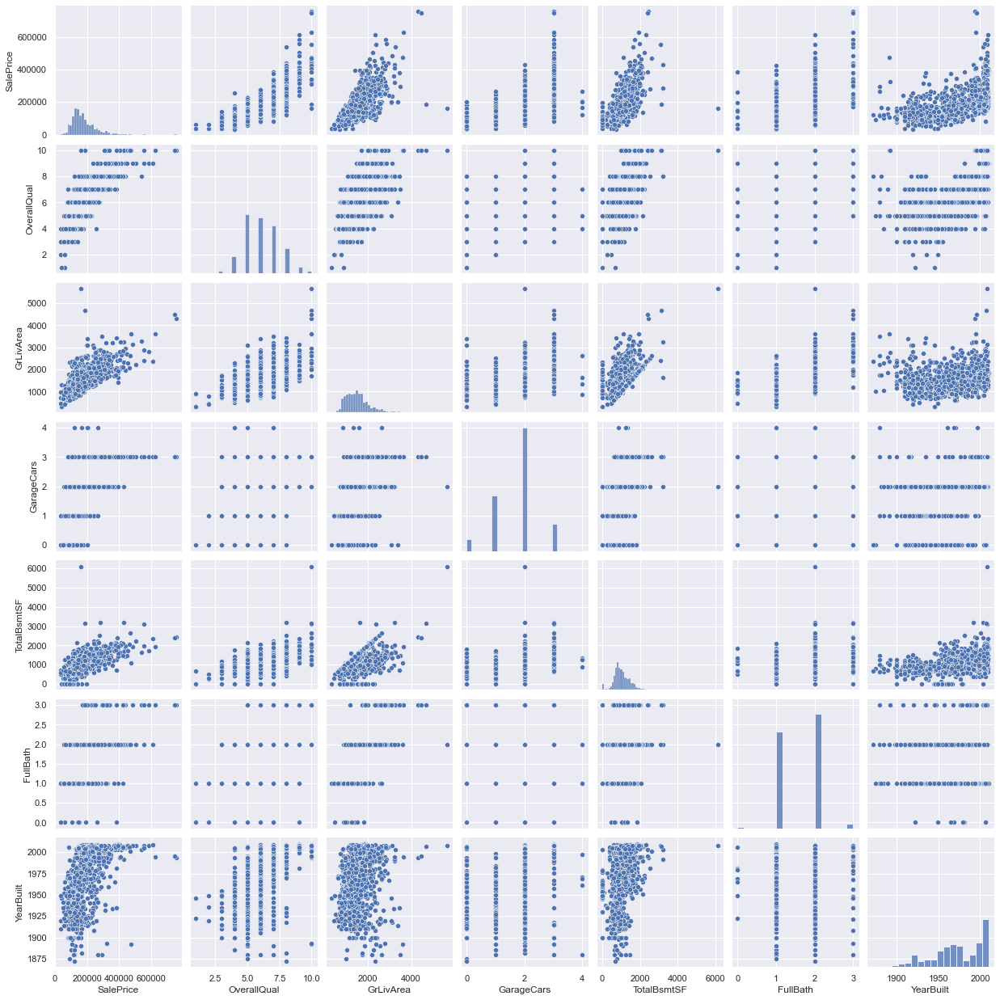

In [63]:
#scatterplot
sns.set()
cols = ['SalePrice','OverallQual','GrLivArea','GarageCars','TotalBsmtSF','FullBath','YearBuilt']
sns.pairplot(df_train[cols],size=2.5)
plt.show()

# Missing data

In [72]:
#missing data
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total,percent],axis=1,keys=['Total','Percent'])
missing_data.head(20)

,Total,Percent


In [80]:
#dealing with missing values
df_train = df_train.drop((missing_data[missing_data['Total'] > 1]).index,1)
df_train.isnull().sum().max()


nan